# Before you get started

## Data formatting

MINER is optimized for expression data of the form log2(TPM+1) or log2(FPKM+1). Expression data in counts format is not currently supported. 

If expression data is not Homo Sapiens, a reference database must be provided for mechanistic inference.

## Data location

This tutorial will import data stored in the "miner/data" folder. Before you start, move your data to the "miner/data" folder. 

## Special dependencies

These dependencies are not required for coexpression clustering or mechanistic inference, but are employed for optional functions in the miner library

Survival analysis:
    install lifelines

# Begin miner analysis

## Import standard dependencies

In [1]:
import numpy as np
import pandas as pd
from scipy import stats
from numpy import random as rd
import os
import json
from sklearn.decomposition import PCA
import multiprocessing, multiprocessing.pool
import matplotlib.pyplot as plt
import seaborn as sns
import time
from collections import Counter
from sklearn.manifold import TSNE
import miner
import datetime
import dill
%matplotlib inline

## Create directory to save output files

In [2]:
# create name for results folder where output files will be saved
resultsFolder = "/Volumes/omics4tb2/alomana/projects/mscni/results/MINER/results.12104"

# create results directory
resultsDirectory = os.path.join(os.path.split(os.getcwd())[0],resultsFolder)
if not os.path.isdir(resultsDirectory):
    os.mkdir(resultsDirectory)

In [3]:
# If previous results exist, use miner.read_json to load them
#revisedClusters = miner.read_json(os.path.join(resultsDirectory,"coexpressionDictionary.json"))
#coexpressionModules = miner.read_json(os.path.join(resultsDirectory,"coexpressionModules.json"))
#regulons = miner.read_json(os.path.join(resultsDirectory,"regulons.json"))
#mechanisticOutput = miner.read_json(os.path.join(resultsDirectory,"mechanisticOutput.json"))

## Pre-process expression data

In [4]:
dataFile='/Volumes/omics4tb2/alomana/projects/mscni/results/scanpy/resultsFile.12104/formatted.expression.data.csv'
expressionData=pd.read_csv(dataFile,index_col=0,header=0)
expressionData, conversionTable = miner.identifierConversion(expressionData)
expressionData = miner.zscore(expressionData)

miner.py:47: FutureWarning: read_table is deprecated, use read_csv instead, passing sep='\t'.
  idMap = pd.read_table(conversionTable)


completed identifier conversion.
8581 genes were converted.


## Set parameters

In [5]:
# minimum number of genes that form an acceptable coexpression cluster:
minNumberGenes = 6 #bulk RNAseq default=6;single cell RNAseq default=6

# minimum correlation coefficient for an acceptable regulator-cluster association 
minCorrelation = 0.05 #bulk RNAseq default=0.2;single cell RNAseq default=0.05

# minimum number of genes that form an acceptable coexpression cluster and have share binding site for regulator:
minNumberRegulonGenes = 4 #bulk RNAseq default=5;single cell RNAseq default=4

# number of cores available for multiprocessing
numCores = 6

## Co-expression clustering

2019-03-20 11:29:54
0.00 percent complete


/Users/alomana/anaconda3/envs/py2/lib/python2.7/site-packages/numpy/core/fromnumeric.py:56: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  return getattr(obj, method)(*args, **kwds)


20.00 percent complete
40.00 percent complete
60.00 percent complete
80.00 percent complete

coexpression clustering completed in 87.54 minutes
Number of genes clustered: 4856
Number of unique clusters: 465
2019-03-20 13:12:55


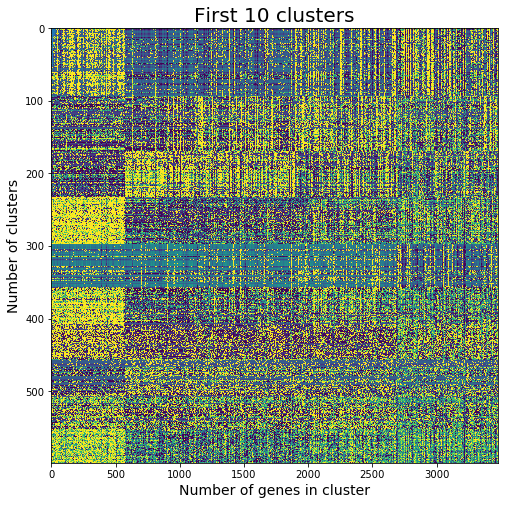

In [6]:
print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

t_start = time.time()
# generate a list of coexpressed gene clusters, all of which have length >= minNumberGenes
initialClusters = miner.cluster(expressionData,minNumberGenes = minNumberGenes,minNumberOverExpSamples=4,maxSamplesExcluded=0.50,random_state=12,overExpressionThreshold=80) 
# revise initialClusters to combine highly correlated clusters and keep only those with significant coexpression
revisedClusters = miner.reviseInitialClusters(initialClusters,expressionData)
# write revisedClusters to .json file
miner.write_json(revisedClusters,os.path.join(resultsDirectory,"coexpressionDictionary.json"))

# visualize first 10 clusters
plt.figure(figsize=(8,8))
plt.imshow(expressionData.loc[np.hstack([revisedClusters[i] for i in range(10)]),:],aspect="auto",cmap="viridis",vmin=-1,vmax=1)
plt.grid(False)
plt.ylabel("Genes",FontSize=20)
plt.xlabel("Samples",FontSize=20)
plt.title("First 10 clusters",FontSize=20)

# report coverage
print("Number of genes clustered: {:d}".format(len(set(np.hstack(initialClusters)))))
print("Number of unique clusters: {:d}".format(len(revisedClusters)))

# plot histogram of the cluster size distribution
counts_ = plt.hist([len(revisedClusters[key]) for key in revisedClusters.keys()],bins=100)
plt.xlabel("Number of genes in cluster",FontSize=14)
plt.ylabel("Number of clusters",FontSize=14)

print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

## Mechanistic inference (only supported for Homo Sapiens)

In [7]:
print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

t1 = time.time()
# get first principal component axes of clusters
axes = miner.principalDf(revisedClusters,expressionData,subkey=None,minNumberGenes=1)
# analyze revised clusters for enrichment in relational database (default: transcription factor binding site database)
mechanisticOutput = miner.mechanisticInference(axes,revisedClusters,expressionData,correlationThreshold=minCorrelation,numCores=numCores,dataFolder=os.path.join("..","data"))
# write mechanistic output to .json file
miner.write_json(mechanisticOutput,os.path.join(resultsDirectory,"mechanisticOutput.json"))
# order mechanisticOutput as {tf:{coexpressionModule:genes}} 
coregulationModules = miner.getCoregulationModules(mechanisticOutput)
# write coregulation modules to .json file
miner.write_json(coregulationModules,os.path.join(resultsDirectory,"coregulationModules.json"))
# get final regulons by keeping genes that requently appear coexpressed and associated to a common regulator
regulons = miner.getRegulons(coregulationModules,minNumberGenes=minNumberRegulonGenes,freqThreshold = 0.333)
# reformat regulon dictionary for consistency with revisedClusters and coexpressionModules
regulonModules, regulonDf = miner.regulonDictionary(regulons)
# write regulons to json file
miner.write_json(regulonModules,os.path.join(resultsDirectory,"regulons.json"))
# define coexpression modules as composite of coexpressed regulons
coexpressionModules = miner.getCoexpressionModules(mechanisticOutput)
# write coexpression modules to .json file
miner.write_json(coexpressionModules,os.path.join(resultsDirectory,"coexpressionModules.json"))
#reconvert revised clusters to original gene annotations
annotatedRevisedClusters = miner.convertDictionary(revisedClusters,conversionTable)
# write annotated coexpression clusters to .json file
miner.write_json(revisedClusters,os.path.join(resultsDirectory,"coexpressionDictionary_annotated.json"))
#reconvert results into original annotations
regulonAnnotatedDf = miner.convertRegulons(regulonDf,conversionTable)
#write annotated regulon table to .csv
regulonAnnotatedDf.to_csv(os.path.join(resultsDirectory,"regulons_annotated.csv"))
#reconvert regulons
annotatedRegulons = miner.convertDictionary(regulonModules,conversionTable)
# write annotated regulons to .json file
miner.write_json(regulons,os.path.join(resultsDirectory,"regulons_annotated.json"))
#reconvert coexpression modules
annotatedCoexpressionModules = miner.convertDictionary(coexpressionModules,conversionTable)
# write annotated coexpression modules to .json file
miner.write_json(coexpressionModules,os.path.join(resultsDirectory,"coexpressionModules_annotated.json"))
t2 = time.time()
print("completed mechanistic inference in {:.2f} minutes".format((t2-t1)/60.))
print(len(regulonDf.Regulator.unique()),len(regulonDf.Gene.unique()))

print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

2019-03-20 13:12:56


/Users/alomana/anaconda3/envs/py2/lib/python2.7/site-packages/pandas/core/indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)
miner.py:764: RuntimeWarning: invalid value encountered in greater_equal
  tfDict[axes[axis]] = tfs[np.where(np.abs(tfCorrelation)>=correlationThreshold)[0]]


0
77
1
78
79
2
80
81
154
82
155
3
83
156
84
157
85
158
231
4
232
159
86
233
160
5
87
234
161
88
235
162
309
6
163
236
89
164
310
165
311
237
90
312
238
166
313
91
92
7
239
314
167
168
240
93
315
241
169
316
387
94
8
95
242
388
317
170
318
389
243
96
171
319
244
390
320
172
245
391
9
97
321
322
173
246
392
323
98
324
247
393
325
174
326
248
394
10
327
99
249
395
175
328
176
396
250
329
100
177
251
397
330
11
252
398
331
101
178
253
332
399
333
179
254
400
102
334
335
336
401
337
180
255
103
338
12
402
339
181
256
403
104
340
257
404
182
341
405
183
105
258
13
406
342
184
259
106
407
343
260
408
107
185
344
409
410
345
14
261
411
186
108
346
262
412
347
187
413
109
263
348
414
188
264
15
415
110
349
416
189
265
350
351
417
266
190
111
352
418
353
16
267
191
419
354
112
268
420
355
192
356
269
113
421
193
17
422
357
270
194
423
114
358
271
424
195
18
272
359
425
115
273
426
196
360
274
116
427
275
428
361
197
19
276
429
362
430
117
198
431
277
363
432
278
118
199
364
433
20
279
434
365
20

## Infer bicluster membership

In [8]:
print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

# select reference dictionary for downstream analysis (revisedClusters, coexpressionModules, or regulonModules)
referenceDictionary = regulonModules
# create a background matrix used for statistical hypothesis testing
bkgd = miner.backgroundDf(expressionData)
# for each cluster, give samples that show high coherent cluster activity
overExpressedMembers = miner.biclusterMembershipDictionary(referenceDictionary,bkgd,label=2,p=0.05)
# for each cluster, give samples that show low coherent cluster activity
underExpressedMembers = miner.biclusterMembershipDictionary(referenceDictionary,bkgd,label=0,p=0.05)
# for each cluster, give samples that do not show coherent cluster activity
dysregulatedMembers = miner.biclusterMembershipDictionary(referenceDictionary,bkgd,label="excluded")
# for each cluster, give samples that show coherent cluster activity, despite magnitude of expression
coherentMembers = miner.biclusterMembershipDictionary(referenceDictionary,bkgd,label="included")

# write membership matrices to .csv file
overExpressedMembersMatrix = miner.membershipToIncidence(overExpressedMembers,expressionData)
overExpressedMembersMatrix.to_csv(os.path.join(resultsDirectory,"overExpressedMembers.csv"))
underExpressedMembersMatrix = miner.membershipToIncidence(underExpressedMembers,expressionData)
underExpressedMembersMatrix.to_csv(os.path.join(resultsDirectory,"underExpressedMembers.csv"))
dysregulatedMembersMatrix = miner.membershipToIncidence(dysregulatedMembers,expressionData)
dysregulatedMembersMatrix.to_csv(os.path.join(resultsDirectory,"dysregulatedMembers.csv"))
coherentMembersMatrix = miner.membershipToIncidence(coherentMembers,expressionData)
coherentMembersMatrix.to_csv(os.path.join(resultsDirectory,"coherentMembers.csv"))

print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

2019-03-20 13:14:54
done!
done!
done!
done!
2019-03-20 16:17:34


## Infer subtypes

2019-03-20 16:17:34
done!
12
2
2
3
5
2
4
2
2
2
2
2
2
2
3
2
Discovered 17 transcriptional states and 22 transcriptional programs
sample coverage within sufficiently large states: 98.0%
2019-03-20 16:36:49


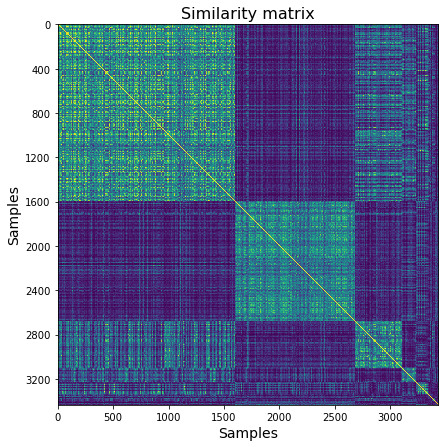

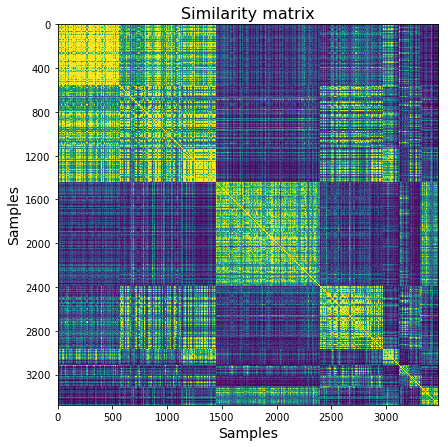

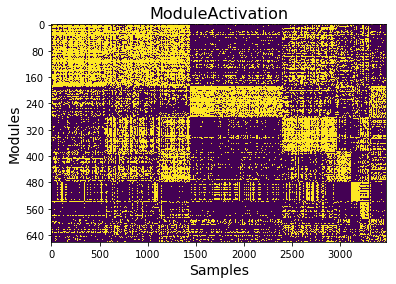

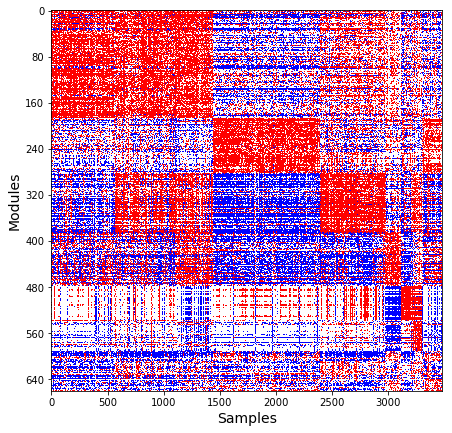

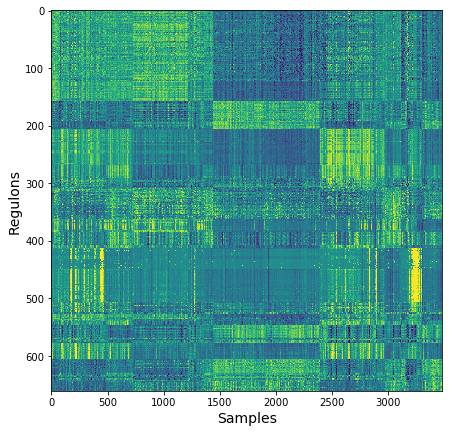

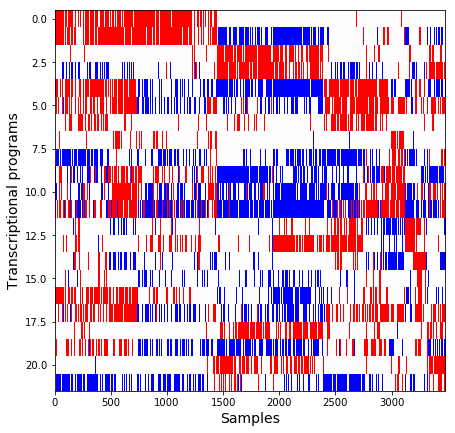

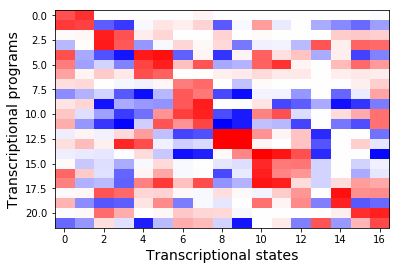

In [9]:
print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

# choose membership type for sample class prediction
sampleDictionary = overExpressedMembers
sampleMatrix = overExpressedMembersMatrix
sampleUnderMatrix = underExpressedMembersMatrix

# perform initial subtype clustering
similarityClusters = miner.f1Decomposition(sampleDictionary,thresholdSFM=0.1)
initialClasses = [i for i in similarityClusters if len(i)>4]

# visualize initial results
sampleFrequencyMatrix = miner.sampleCoincidenceMatrix(sampleDictionary,freqThreshold = 0.333,frequencies=True) #0.333
similarityMatrix = sampleFrequencyMatrix*sampleFrequencyMatrix.T
miner.plotSimilarity(similarityMatrix,np.hstack(initialClasses),vmin=0,vmax=0.5,title="Similarity matrix",xlabel="Samples",ylabel="Samples",fontsize=14,figsize=(7,7),savefig=os.path.join(resultsDirectory,"similarityMatrix_regulons.pdf"))

# expand initial subtype clusters
centroidClusters, centroidMatrix = miner.centroidExpansion(initialClasses,sampleMatrix,f1Threshold = 0.1,returnCentroids=True) #0.3
centroidMatrix.to_csv(os.path.join(resultsDirectory,"centroids.csv"))
unmapped = list(sampleMatrix.columns[np.where(sampleMatrix.sum(axis=0)==0)[0]])
mappedSamples = [i for i in np.hstack(centroidClusters) if i not in unmapped]
mappedClusters = miner.mapExpressionToNetwork(centroidMatrix,sampleMatrix,threshold = 0.05)

# visualize expanded subtype clusters
miner.plotSimilarity(similarityMatrix,mappedSamples,vmin=0,vmax=0.333,title="Similarity matrix",xlabel="Samples",ylabel="Samples",fontsize=14,figsize=(7,7),savefig=os.path.join(resultsDirectory,"centroidClusters_regulons.pdf"))

# Generate heatmaps of module activity
orderedOverExpressedMembers = miner.orderMembership(centroidMatrix,sampleMatrix,mappedClusters,ylabel="Modules",resultsDirectory=None)
orderedDM = miner.plotDifferentialMatrix(overExpressedMembersMatrix,underExpressedMembersMatrix,orderedOverExpressedMembers,cmap="bwr",aspect="auto",saveFile=os.path.join(resultsDirectory,"centroid_clusters_heatmap.pdf"))

# Infer transcriptional programs and states
programs, states = miner.mosaic(dfr=orderedDM,clusterList=centroidClusters,minClusterSize_x=9,minClusterSize_y=5,allow_singletons=False,max_groups=50,saveFile=os.path.join(resultsDirectory,"regulon_activity_heatmap.pdf"),random_state=12)   
transcriptional_programs, program_regulons = miner.transcriptionalPrograms(programs,referenceDictionary)
program_list = [program_regulons[("").join(["TP",str(i)])] for i in range(len(program_regulons))]
mosaicDf = orderedDM.loc[np.hstack(program_list),np.hstack(states)]
mosaicDf.to_csv(os.path.join(resultsDirectory,"regulons_activity_heatmap.csv"))

# Get eigengenes for all modules
eigengenes = miner.getEigengenes(referenceDictionary,expressionData,regulon_dict=None,saveFolder=None)

#write eigengenes to .csv
eigengenes.to_csv(os.path.join(resultsDirectory,"eigengenes.csv"))

#plot eigengenes
plt.imshow(eigengenes.loc[np.hstack(program_list),np.hstack(states)],cmap="viridis",vmin=-0.05,vmax=0.05,aspect="auto")
plt.grid(False)

# calculate percent of samples that fall into a state with >= minimum acceptable number of samples
groups = [states[i] for i in range(len(states)) if len(states[i])>=int(np.ceil(0.01*expressionData.shape[1]))]
print('Discovered {:d} transcriptional states and {:d} transcriptional programs'.format((len(states)),len(transcriptional_programs)))
print('sample coverage within sufficiently large states: {:.1f}%'.format(100*float(len(np.hstack(groups)))/expressionData.shape[1]))

#write all transcriptional program genesets to text files for external analysis
if not os.path.isdir(os.path.join(resultsDirectory,"transcriptional_programs_coexpressionModules")):
    os.mkdir(os.path.join(resultsDirectory,"transcriptional_programs_coexpressionModules"))
    
for tp in transcriptional_programs.keys():
    np.savetxt(os.path.join(resultsDirectory,"transcriptional_programs_coexpressionModules",(".").join([tp,"txt"])),transcriptional_programs[tp],fmt="%1.50s")
    
# Determine activity of transcriptional programs in each sample
statesDf = miner.reduceModules(df=orderedDM,programs=program_list,states=states,stateThreshold=0.65,saveFile=os.path.join(resultsDirectory,"transcriptional_programs_vs_samples.pdf"))

# Cluster patients into subtypes and give the activity of each program in each subtype
programsVsStates = miner.programsVsStates(statesDf,states,filename=os.path.join(resultsDirectory,"programs_vs_states.pdf"))

print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

# Visualize with tSNE

2019-03-20 16:36:51
2019-03-20 16:37:50


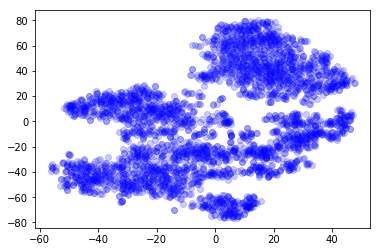

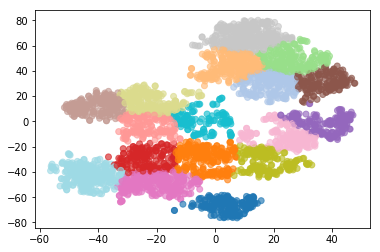

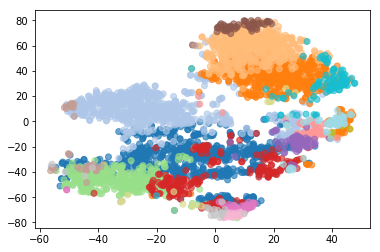

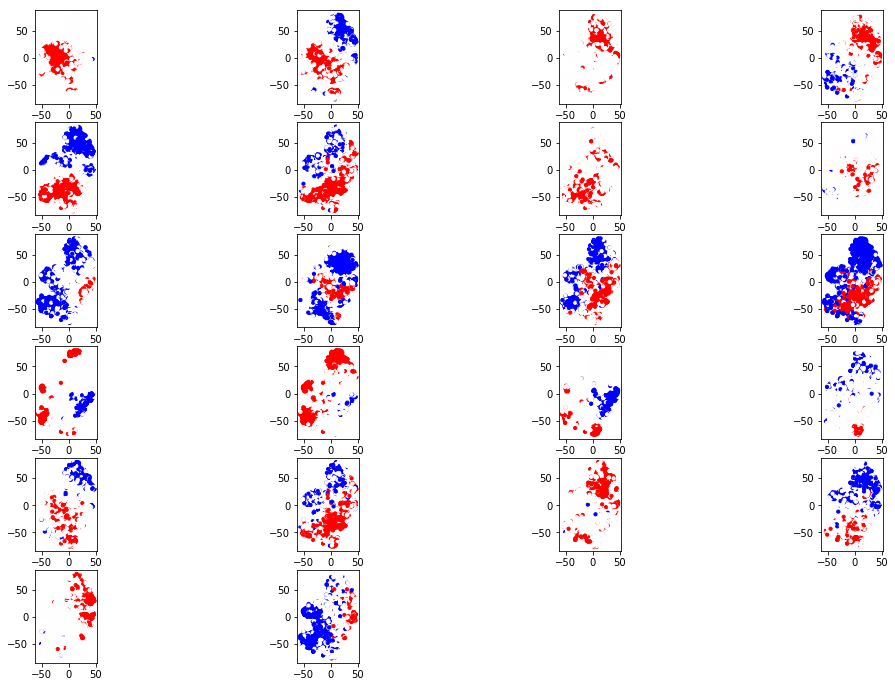

In [10]:
print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

# tSNE applied to expressionData. Set plotOnly = False to return tSNE coordinates
# consider changing the perplexity to explore different degrees of cluster separation
#miner.tsne(expressionData,perplexity=15,n_components=2,n_iter=1000,plotOnly=True,plotColor="red",alpha=0.4)
#plt.savefig(os.path.join(resultsDirectory,"tsne_gene_expression.pdf"),bbox_inches="tight")

# tSNE applied to df_for_tsne. Consider changing the perplexity in the range of 5 to 50
df_for_tsne = mosaicDf.copy() # discrete heatmap of 600 regulons
df_for_tsne2 = eigengenes.copy() # continuous heatmap of 600 regulons, run umap plus louvain
plt.figure()
X_embedded = miner.tsne(df_for_tsne,perplexity=30,n_components=2,n_iter=1000,plotOnly=None,plotColor="blue",alpha=0.2)
tsneDf = pd.DataFrame(X_embedded)
tsneDf.index = df_for_tsne.columns
tsneDf.columns = ["tsne1","tsne2"]
plt.savefig(os.path.join(resultsDirectory,"tsne_regulon_activity.pdf"),bbox_inches="tight")

# How many clusters do you expect? Start with number of states
numberOfClusters = len(states)

# Are the clusters separated how you thought? If not, change the random_state to a different number and retry
random_state=12

clusters, labels, centroids = miner.kmeans(tsneDf,numClusters=numberOfClusters,random_state=random_state)

# overlay kmeans cluster labels
plt.figure()
plt.scatter(tsneDf.iloc[:,0],tsneDf.iloc[:,1],cmap="tab20",c=labels,alpha=0.65)
plt.savefig(os.path.join(resultsDirectory,"labeled_tsne_kmeans.pdf"),bbox_inches="tight")

# convert states to tsne labels
state_labels = miner.tsneStateLabels(tsneDf,states)

# overlay states cluster labels
plt.figure()
plt.scatter(tsneDf.iloc[:,0],tsneDf.iloc[:,1],cmap="tab20",c=state_labels,alpha=0.65)
plt.savefig(os.path.join(resultsDirectory,"labeled_tsne_states.pdf"),bbox_inches="tight")

# overlay activity of transcriptional programs
miner.plotStates(statesDf,tsneDf,numCols=int(np.sqrt(statesDf.shape[0])),saveFile = os.path.join(resultsDirectory,("_").join(["states_regulons",("").join(["0o",str(minCorrelation).split(".")[1]]),"tsne.pdf"])),aspect=1,size=10,scale=3)

print(datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S"))

In [11]:
print(len(states))

17


In [12]:
print(len(centroidClusters))


12


In [46]:
mosaicDf.loc[:,states[0]]
extendedRegulons=overExpressedMembersMatrix-underExpressedMembersMatrix
print(len(extendedRegulons))

1489


In [103]:
ngenes=0
for regulon in regulonModules.keys():
    n=len(regulonModules[regulon])
    ngenes=ngenes+n
print(ngenes)

17241


In [14]:
print(regulonModules['123'])

['ENSG00000158022', 'ENSG00000118298', 'ENSG00000189319', 'ENSG00000130821', 'ENSG00000103249', 'ENSG00000101197']


In [1]:
regulonDf[regulonDf.Regulon_ID=='123']

NameError: name 'regulonDf' is not defined

In [16]:
transcriptional_programs['TP0'] # to gene mania

['ENSG00000166562',
 'ENSG00000106554',
 'ENSG00000125835',
 'ENSG00000161960',
 'ENSG00000009307',
 'ENSG00000138381',
 'ENSG00000139343',
 'ENSG00000091527',
 'ENSG00000262771',
 'ENSG00000137776',
 'ENSG00000151239',
 'ENSG00000103187',
 'ENSG00000106078',
 'ENSG00000171928',
 'ENSG00000130204',
 'ENSG00000105472',
 'ENSG00000104472',
 'ENSG00000106305',
 'ENSG00000177565',
 'ENSG00000065268',
 'ENSG00000163714',
 'ENSG00000100418',
 'ENSG00000255302',
 'ENSG00000281766',
 'ENSG00000136810',
 'ENSG00000111775',
 'ENSG00000132432',
 'ENSG00000198612',
 'ENSG00000149925',
 'ENSG00000198258',
 'ENSG00000130511',
 'ENSG00000154582',
 'ENSG00000106399',
 'ENSG00000166226',
 'ENSG00000188725',
 'ENSG00000161547',
 'ENSG00000084623',
 'ENSG00000182552',
 'ENSG00000176386',
 'ENSG00000143977',
 'ENSG00000119705',
 'ENSG00000198937',
 'ENSG00000176261',
 'ENSG00000104671',
 'ENSG00000072110',
 'ENSG00000132507',
 'ENSG00000100319',
 'ENSG00000163866',
 'ENSG00000101150',
 'ENSG00000103275',


In [17]:
print(len(program_list)) # list of lists of regulons
print(program_list)

22
[['0', '4', '517', '9', '526', '103', '557', '562', '578', '579', '594', '595', '597', '599', '1113', '90', '615', '104', '618', '621', '622', '626', '630', '1155', '649', '140', '1170', '1178', '680', '169', '682', '688', '180', '709', '206', '376', '726', '728', '218', '1243', '1245', '1248', '740', '294', '892', '237', '296', '467', '247', '1273', '1274', '1276', '253', '255', '1280', '1282', '1284', '782', '1069', '1296', '1301', '1308', '798', '803', '1318', '1320', '299', '1328', '1331', '1332', '1336', '828', '829', '327', '341', '347', '861', '350', '1377', '355', '357', '1382', '364', '1410', '1172', '890', '383', '1409', '901', '393', '916', '407', '408', '409', '1437', '1441', '418', '1443', '1448', '1450', '1452', '1456', '867', '444', '447', '1476', '965', '454', '967', '974', '419', '995', '996', '1006', '1277', '500', '1013', '681', '1194', '464', '336', '114', '1082'], ['7', '525', '1040', '536', '558', '572', '592', '98', '102', '627', '148', '673', '678', '710', '7

In [18]:
regulonAnnotatedDf.head()

,Regulon_ID,Regulator,Gene
0,0,ETS1,EBNA1BP2
1,0,ETS1,TMEM14B
2,0,ETS1,SNRPB
3,0,ETS1,CALM2
4,0,ETS1,TPI1


In [19]:
regulonAnnotatedDf[regulonAnnotatedDf.Regulon_ID=='123']

,Regulon_ID,Regulator,Gene
1448,123,ESR1,TRIM63
1449,123,ESR1,CA14
1450,123,ESR1,FAM53B
1451,123,ESR1,SLC6A8
1452,123,ESR1,CLCN7
1453,123,ESR1,BIRC7


# Differentiating regulons

Index([u'AACCGCGTCTCAAACG_M397.control.1', u'AAGTCTGCAGCTCGCA_M397.control.1',
       u'ACACCGGGTCAATGTC_M397.control.1', u'ACATCAGCACCTCGGA_M397.control.5',
       u'ACTATCTGTCTCAACA_M397.control.1', u'AGCTCCTTCCAATGGT_M397.control.1',
       u'ATAGACCGTCTTCTCG_M397.control.1', u'ATCGAGTTCGAATGGG_M397.control.1',
       u'ATGGGAGTCAGTTTGG_M397.control.1', u'ATTATCCAGCTAAACA_M397.control.1',
       ...
       u'TTCGAAGAGGGCACTA_M397.day24.2', u'TTCGAAGGTCATGCCG_M397.day24.6',
       u'TTGACTTCATGCTAGT_M397.day24.6', u'TTGCCGTGTTATGCGT_M397.day24.2',
       u'TTGCGTCTCGGCGCTA_M397.day24.2', u'TTTATGCAGAATGTTG_M397.day24.7',
       u'TTTCCTCGTCTCAACA_M397.day24.2', u'TTTGCGCCATGACGGA_M397.day24.2',
       u'TTTGGTTAGTACGACG_M397.day24.2', u'TTTGTCATCTTCGGTC_M397.day24.6'],
      dtype='object', length=727)
1489
      t-statistic        p-value
1285    20.901302   8.432624e-43
1331    18.919390   3.098814e-33
471     18.431731   1.642959e-33
998     18.233902   5.343124e-33
472     17.838

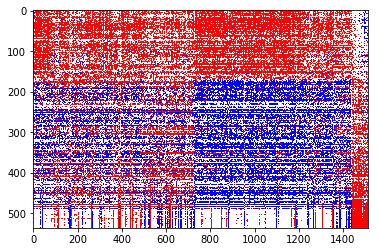

In [51]:
print(states[0])
states_list_1 = [states[0],states[1]]
states_list_2 = [states[10],states[11]]
reference_matrix = overExpressedMembersMatrix-underExpressedMembersMatrix
print(len(regulonModules))
p = 0.05/(len(regulonModules))
p=1e-10

results = miner.getStratifyingRegulons(states_list_1,states_list_2,reference_matrix,p,plot=True)

In [32]:
import dill

In [33]:
dill.dump_session('notebook.MSCNI.db')

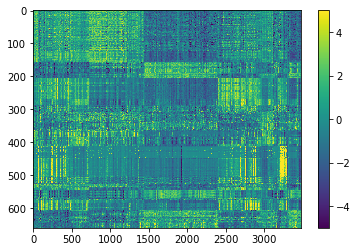

In [45]:
#plot eigengenes
plt.imshow(100*eigengenes.loc[np.hstack(program_list),np.hstack(states)],cmap="viridis",vmin=-5,vmax=5,aspect="auto")
plt.grid(False)
plt.colorbar()

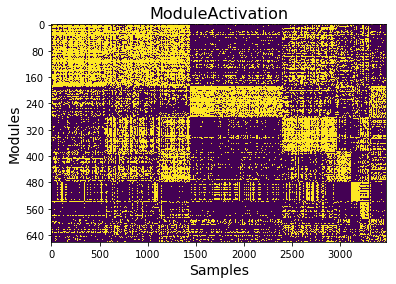

In [44]:
# Generate heatmaps of module activity
orderedOverExpressedMembers = miner.orderMembership(centroidMatrix,sampleMatrix,mappedClusters,ylabel="Modules",resultsDirectory=None)


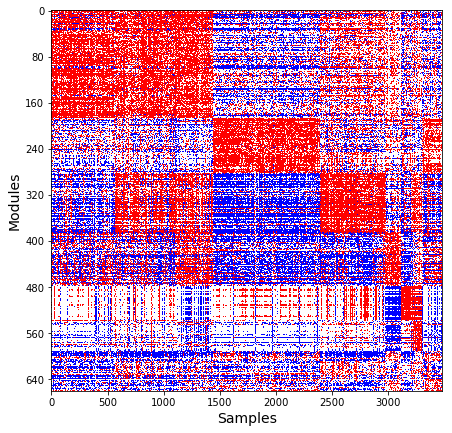

In [36]:
orderedDM = miner.plotDifferentialMatrix(overExpressedMembersMatrix,underExpressedMembersMatrix,orderedOverExpressedMembers,cmap="bwr",aspect="auto",saveFile=os.path.join(resultsDirectory,"centroid_clusters_heatmap.pdf"))

In [ ]:
eigengenes100, regulons, and regulons extended


In [49]:
identifier_mapping = pd.read_csv(os.path.join(os.path.split(os.getcwd())[0],"data","identifier_mappings.txt"),sep="\t")
identifier_mapping_entrez = identifier_mapping[identifier_mapping.Source == "Entrez Gene ID"]
identifier_mapping_entrez.index = identifier_mapping_entrez.iloc[:,0]

Gene = []
Group = []
identified_genes = set(identifier_mapping_entrez.index)
for key in revisedClusters.keys():
    cluster = revisedClusters[key] # 
    
    tmp_genes = list(set(cluster)&identified_genes)
    tmp_entrez = list(identifier_mapping_entrez.loc[tmp_genes,"Name"])
    tmp_group = [key for i in range(len(tmp_entrez))]
    Gene.extend(tmp_entrez)
    Group.extend(tmp_group)

firm_df = pd.DataFrame(np.vstack([Gene,Group]).T)
firm_df.columns = ["Gene","Group"]    
firm_df.to_csv(os.path.join(resultsDirectory,"firm.results.2019.03.21.csv"),index=None,sep="\t")


In [52]:
full_heatmap=overExpressedMembersMatrix-underExpressedMembersMatrix
full_heatmap.to_csv(os.path.join(resultsDirectory,"full_heatmap.csv"))

In [58]:
with open(os.path.join(resultsDirectory,"stateLabels.csv"),'w') as f:
    for i in range(len(states)):
        for cellID in states[i]:
            f.write('{},{}\n'.format(i,cellID))

# creating heatmaps and regulons that are significanlty different among states

In [65]:
# read states
labelFile='/Volumes/omics4tb2/alomana/projects/mscni/results/scanpy/states.Louvain/state.labels.Louvain.csv'
cells2State={}

with open(labelFile,'r') as f:
    for line in f:
        v=line.split(',')
        cellID=v[0]
        state=int(v[1].replace('\n',''))
        if state not in cells2State:
            cells2State[state]=[]
        cells2State[state].append(cellID)

In [96]:
def getStratifyingRegulons2(label,states_list_1,states_list_2,reference_matrix,p=0.05,plot=True):
    
    if type(states_list_1[0]) is 'str':
        states_list_1 = [states_list_1]
        
    if type(states_list_2[0]) is 'str':
        states_list_2 = [states_list_2]
        
    matrix1 = reference_matrix.loc[:,np.hstack(states_list_1)]
    matrix2 = reference_matrix.loc[:,np.hstack(states_list_2)]

    ttest = stats.ttest_ind(matrix1,matrix2,axis=1,equal_var=False)
    
    if min(ttest[1]) > p:
        print("No hits detected. Cutoff p-value is too strict")
        return []

    results = pd.DataFrame(np.vstack(ttest).T)
    results.index = reference_matrix.index
    results.columns = ["t-statistic","p-value"]
    results = results[results["p-value"]<=p]
    results.sort_values(by="t-statistic",ascending=False,inplace=True)
    ###print(results)

    if plot is True:
        ttest_data_source = reference_matrix.loc[results.index,np.hstack([np.hstack(states_list_1),np.hstack(states_list_2)])]
        figure = plt.figure()
        ax = figure.gca()
        ax.imshow(ttest_data_source,cmap="bwr",aspect="auto")
        ax.grid(False)
        #ax.title(label)
        plt.savefig('{}/figure.pdf'.format(label))
        
    return results

In [104]:
ls()

/bin/sh: -c: line 0: syntax error near unexpected token `('
/bin/sh: -c: line 0: `ls -F -G ()'


comparison.0.1
(561, 512)
comparison.1.0
(512, 561)
comparison.0.2
(561, 373)
comparison.2.0
(373, 561)
comparison.0.3
(561, 342)
comparison.3.0
(342, 561)
comparison.0.4
(561, 318)
comparison.4.0
(318, 561)
comparison.0.5
(561, 275)
comparison.5.0
(275, 561)
comparison.0.6
(561, 273)
comparison.6.0
(273, 561)
comparison.0.7
(561, 243)
comparison.7.0
(243, 561)
comparison.0.8
(561, 236)
comparison.8.0
(236, 561)
comparison.0.9
(561, 203)
comparison.9.0
(203, 561)
comparison.0.10
(561, 141)
comparison.10.0
(141, 561)
comparison.1.2
(512, 373)
comparison.2.1
(373, 512)
comparison.1.3
(512, 342)
comparison.3.1
(342, 512)
comparison.1.4
(512, 318)
comparison.4.1
(318, 512)
comparison.1.5
(512, 275)
comparison.5.1
(275, 512)
comparison.1.6
(512, 273)
comparison.6.1
(273, 512)
comparison.1.7
(512, 243)
comparison.7.1
(243, 512)
comparison.1.8
(512, 236)
comparison.8.1
(236, 512)
comparison.1.9
(512, 203)
comparison.9.1
(203, 512)
comparison.1.10
(512, 141)
comparison.10.1
(141, 512)
comparis

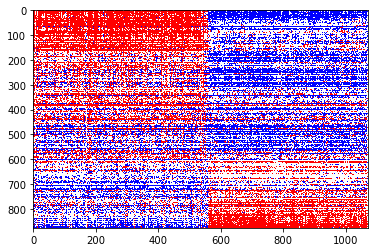

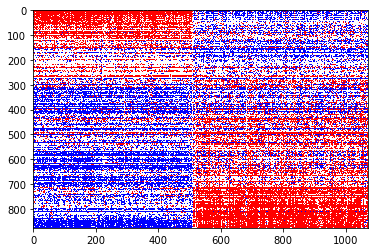

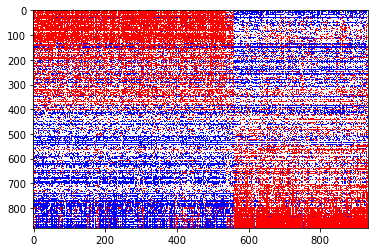

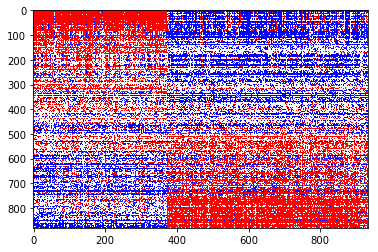

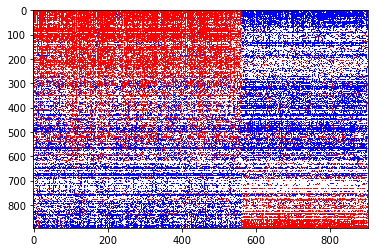

...

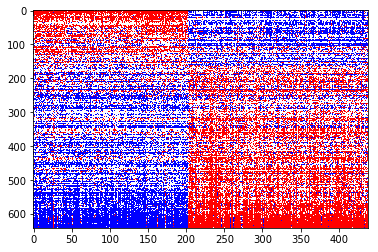

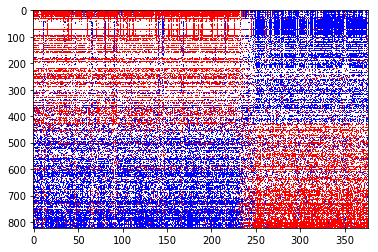

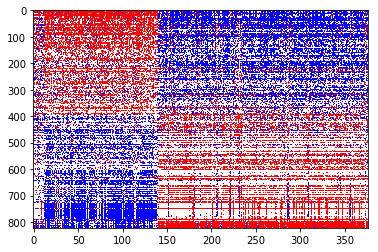

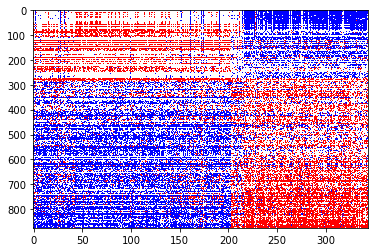

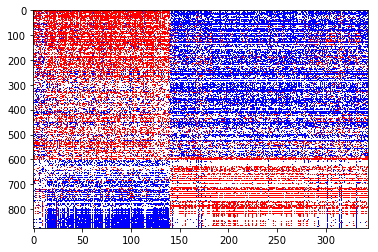

In [97]:
import os
p=1e-10
reference_matrix = overExpressedMembersMatrix-underExpressedMembersMatrix


# for each comparison possible (both ways), create a list of DE regulons and a heatmap
cellStateLabels=cells2State.keys()
cellStateLabels.sort()
cellStateLabels=[str(element) for element in cellStateLabels]

#cellStateLabels=[0,1,2]
for i in range(len(cellStateLabels)):
    for j in range(len(cellStateLabels)):
        if i < j:
            # comparison a
            comparisonLabel='comparison.{}.{}'.format(i,j)
            print(comparisonLabel)
            if os.path.exists(comparisonLabel) == False:
                os.mkdir(comparisonLabel)
            
            list1 = cells2State[i]
            list2 = cells2State[j]
            print(len(list1),len(list2))
            results = getStratifyingRegulons2(comparisonLabel,list1,list2,reference_matrix,p,plot=True)
            results.to_csv('{}/results.csv'.format(comparisonLabel))
            
            # comparison b
            comparisonLabel='comparison.{}.{}'.format(j,i)
            print(comparisonLabel)
            if os.path.exists(comparisonLabel) == False:
                os.mkdir(comparisonLabel)
            
            list1 = cells2State[j]
            list2 = cells2State[i]
            print(len(list1),len(list2))
            results = getStratifyingRegulons2(comparisonLabel,list1,list2,reference_matrix,p,plot=True)
            results.to_csv('{}/results.csv'.format(comparisonLabel))
            

['control', 'day13', 'day17', 'day24', 'day3', 'day6']
comparison.control.day13
(572, 895)
comparison.day13.control
(895, 572)
comparison.control.day17
(572, 695)
comparison.day17.control
(695, 572)
comparison.control.day24
(572, 783)
comparison.day24.control
(783, 572)
comparison.control.day3
(572, 290)
comparison.day3.control
(290, 572)
comparison.control.day6
(572, 242)
comparison.day6.control
(242, 572)
comparison.day13.day17
(895, 695)
comparison.day17.day13
(695, 895)
comparison.day13.day24
(895, 783)
comparison.day24.day13
(783, 895)
comparison.day13.day3
(895, 290)
comparison.day3.day13
(290, 895)
comparison.day13.day6
(895, 242)
comparison.day6.day13
(242, 895)
comparison.day17.day24
(695, 783)
comparison.day24.day17
(783, 695)
comparison.day17.day3
(695, 290)
comparison.day3.day17
(290, 695)
comparison.day17.day6
(695, 242)
comparison.day6.day17
(242, 695)
comparison.day24.day3
(783, 290)
comparison.day3.day24
(290, 783)
comparison.day24.day6
(783, 242)
comparison.day6.day24


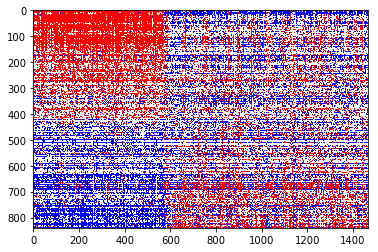

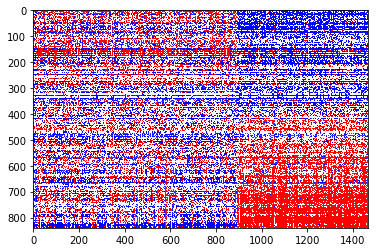

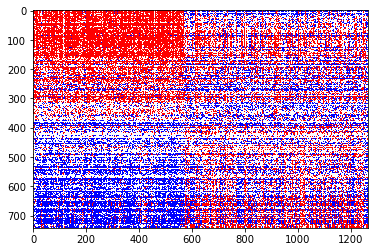

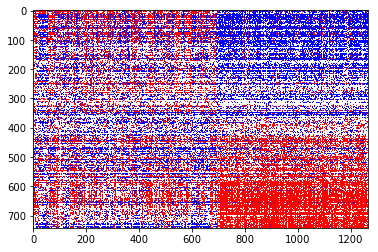

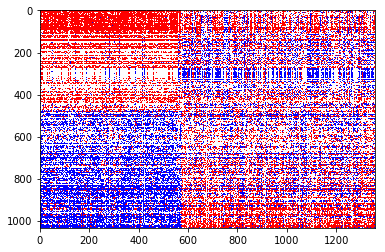

...

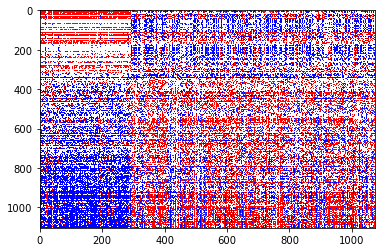

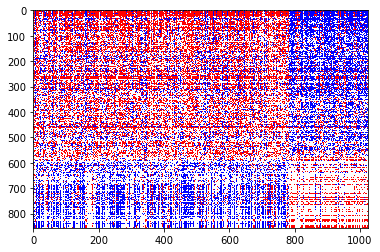

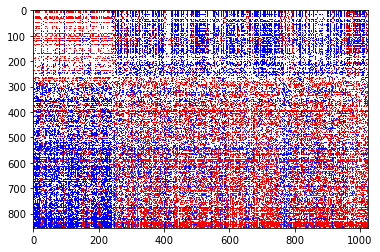

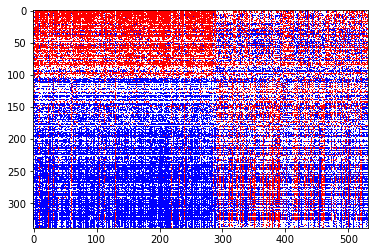

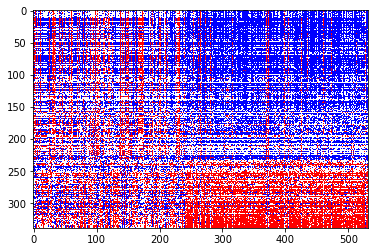

In [113]:
cellPerDay={}
for element in expressionData.keys():
    tag=element.split('_M397.')[1].split('.')[0]
    if tag not in cellPerDay:
        cellPerDay[tag]=[]
    cellPerDay[tag].append(element)
allDays=cellPerDay.keys()
allDays.sort()
print(allDays)


for i in range(len(allDays)):
    for j in range(len(allDays)):
        if i < j:
            # comparison a
            comparisonLabel='comparison.{}.{}'.format(allDays[i],allDays[j])
            print(comparisonLabel)
            if os.path.exists(comparisonLabel) == False:
                os.mkdir(comparisonLabel)
            
            list1 = cellPerDay[allDays[i]]
            list2 = cellPerDay[allDays[j]]
            print(len(list1),len(list2))
            results = getStratifyingRegulons2(comparisonLabel,list1,list2,reference_matrix,p,plot=True)
            results.to_csv('{}/results.csv'.format(comparisonLabel))
            
            # comparison b
            comparisonLabel='comparison.{}.{}'.format(allDays[j],allDays[i])
            print(comparisonLabel)
            if os.path.exists(comparisonLabel) == False:
                os.mkdir(comparisonLabel)
            
            list1 = cellPerDay[allDays[j]]
            list2 = cellPerDay[allDays[i]]
            print(len(list1),len(list2))
            results = getStratifyingRegulons2(comparisonLabel,list1,list2,reference_matrix,p,plot=True)
            results.to_csv('{}/results.csv'.format(comparisonLabel))